# NEURAL NETWORKS AND DEEP LEARNING

---
A.A. 2021/22 (6 CFU) - Dr. Alberto Testolin, Dr. Umberto Michieli
---


# Homework 2 - Unsupervised Deep Learning

Student: Federico Michelotto - 1218322


## Import

In [1]:
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import metrics, manifold
import random
import math

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torchvision
from torchvision import transforms

import optuna
from optuna.trial import TrialState
from sklearn.model_selection import KFold

## Imports for plotting
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
import plotly.express as px # this is another plotting library for interactive plot
import seaborn as sns
sns.set()

## Progress bar
from tqdm.notebook import tqdm

/tmp/ipykernel_4837/3738916405.py:25: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export


In [2]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [3]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Training device: {device}")

Training device: cuda


In [4]:
# Function for setting the seed
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
set_seed(0)

## Dataset

Download the dataset:

In [5]:
train_dataset = torchvision.datasets.FashionMNIST('classifier_data', train=True, download=True)
test_dataset  = torchvision.datasets.FashionMNIST('classifier_data', train=False, download=True)
len(train_dataset), len(test_dataset)

(60000, 10000)

Get id-to-label dictionary

In [6]:
id_to_label = {value : key for (key, value) in train_dataset.class_to_idx.items()}

Show id-to-label dictionary

In [7]:
print(id_to_label)

{0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat', 5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8: 'Bag', 9: 'Ankle boot'}


How to get an image and the corresponding label:

SAMPLE AT INDEX 0
LABEL: 9


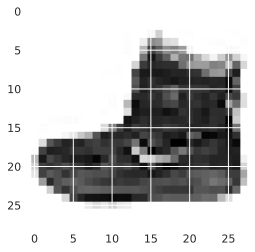

In [8]:
sample_index = 0
image = train_dataset[sample_index][0]
label = train_dataset[sample_index][1]

fig = plt.figure(figsize=(4,4))
plt.imshow(image, cmap='Greys')
print(f"SAMPLE AT INDEX {sample_index}")
print(f"LABEL: {label}")

The output of the dataset is a PIL Image, a python object specifically developed to manage and process images. PyTorch supports this format, and there are useful transforms available natively in the framework: https://pytorch.org/docs/stable/torchvision/transforms.html

If you want, you can easily convert a PIL image to a numpy array and entirely ignore the PIL object:

In [9]:
image_numpy = np.array(image)

print(f'Numpy array shape: {image_numpy.shape}')
print(f'Numpy array type: {image_numpy.dtype}')

Numpy array shape: (28, 28)
Numpy array type: uint8


To transform a PIL Image directly to a PyTorch tensor, instead:

In [10]:
to_tensor = torchvision.transforms.ToTensor()
image_tensor = to_tensor(image)

print(f'PyTorch tensor shape: {image_tensor.shape}')
print(f'PyTorch tensor type: {image_tensor.dtype}')

PyTorch tensor shape: torch.Size([1, 28, 28])
PyTorch tensor type: torch.float32


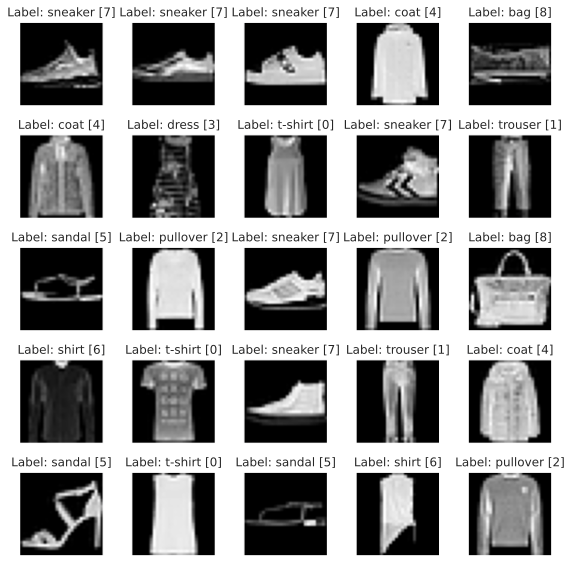

In [11]:
### Plot some sample
label_names=['t-shirt','trouser','pullover','dress','coat','sandal','shirt',
             'sneaker','bag','boot']
fig, axs = plt.subplots(5, 5, figsize=(8,8))
for ax in axs.flatten():
    # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
    img, label = random.choice(train_dataset)
    ax.imshow(np.array(img), cmap='gist_gray')
    ax.set_title(f'Label: {label_names[label]} [{label}]')
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

In [12]:
from collections import Counter
print(Counter(np.array(train_dataset.targets)))
print(Counter(np.array(test_dataset.targets)))

Counter({9: 6000, 0: 6000, 3: 6000, 2: 6000, 7: 6000, 5: 6000, 1: 6000, 6: 6000, 4: 6000, 8: 6000})
Counter({9: 1000, 2: 1000, 1: 1000, 6: 1000, 4: 1000, 5: 1000, 7: 1000, 3: 1000, 8: 1000, 0: 1000})


In [13]:
transform = transforms.Compose([
    transforms.ToTensor()
])

# Set the train transform
train_dataset.transform = transform
# Set the test transform
test_dataset.transform = transform

In [14]:
### Define train dataloader
train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True)
### Define test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=256, shuffle=False)

# Solution

## Autoencoder

Define a training epoch

In [15]:
### Training function
def train_epoch_autoencoder(network, device, dataloader, loss_fn, optimizer):
    # Set train mode
    network.train()
    for image_batch, _ in dataloader:
        # Move tensors to the selected device
        image_batch = image_batch.to(device)
        # Forward pass
        output = network(image_batch)
        # Evaluate loss
        loss = loss_fn(output, image_batch)
        # Backward pass and update
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

Define a test epoch

In [16]:
### Testing function
def test_epoch_autoencoder(network, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    network.eval()
    val_loss= []
    with torch.no_grad(): # Disable gradient tracking
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_target = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Forward pass
            output = network(image_batch)
            # Append the network output and the original image to the lists
            conc_out.append(output.cpu())
            conc_target.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_target = torch.cat(conc_target) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_target)
    return conc_out, conc_target, val_loss.data # We return all the outputs, all the labels and the global loss


Define a custom encoder with an architecture similar to the one used in hw1. <br>
In particular the stage *[[CONV -> RELU]\*N -> POOL]* is repeated twice in order to have have feature maps of size 7x7 before the unflatten layer. 

In [28]:
class define_encoder(nn.Module):

    def __init__(self, N, filter_sizes, fc_hidden_units, dim_latent_space):   
        super().__init__()
        # ENCODER = [[CONV -> RELU]*N -> POOL]*2 {7x7} -> [FC -> RELU]*K -> FC

        ## Convolutional layers
        conv_layers = []
        in_channels = 1
        for i in range(2):
            out_channels = filter_sizes[i]
            for j in range(N):
                conv_layers.append(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1))
                conv_layers.append(nn.BatchNorm2d(out_channels))
                conv_layers.append(nn.ReLU(True))
                in_channels = out_channels
            conv_layers.append(nn.MaxPool2d(kernel_size = 2, stride=2))
        # 7x7 feature maps 

        self.encoder_cnn = nn.Sequential(*conv_layers) 

        ## Flatten
        self.flatten = nn.Flatten(start_dim=1)

        ## Linear layers
        lin_layers = []
        in_features = out_channels*49
        for i in range( len(fc_hidden_units) ):
            out_features = fc_hidden_units[i]
            lin_layers.append(nn.Linear(in_features = in_features, out_features = out_features))
            lin_layers.append(nn.BatchNorm1d(out_features))
            lin_layers.append(nn.ReLU(True))
            in_features = out_features

        lin_layers.append(nn.Linear(in_features = out_features, out_features = dim_latent_space))

        self.encoder_lin = nn.Sequential(*lin_layers) 
        self.dim_latent_space = dim_latent_space
        
    def forward(self, x):
        # Apply convolutions
        x = self.encoder_cnn(x)
        # Flatten
        x = self.flatten(x)
        # # Apply linear layers
        x = self.encoder_lin(x)
        return x

Define a custom decoder with an architecture symmetric to the encoder

In [29]:
class define_decoder(nn.Module):

    def __init__(self, dim_latent_space, fc_hidden_units, filter_sizes, N):  
        super().__init__() 
        # DECODER = FC -> [FC -> RELU]*K -> [CONV_TRANSPOSE -> [CONV -> RELU]*N ]*2

        in_features = dim_latent_space
        ## Linear layers
        lin_layers = []
        for i in range( len(fc_hidden_units) ):
            out_features = fc_hidden_units[i]
            lin_layers.append(nn.Linear(in_features = in_features, out_features = out_features))
            lin_layers.append(nn.BatchNorm1d(out_features))
            lin_layers.append(nn.ReLU(True))
            in_features = out_features
        out_features = filter_sizes[0]*49

        lin_layers.append(nn.Linear(in_features = in_features, out_features = out_features))
        lin_layers.append(nn.BatchNorm1d(out_features))
        lin_layers.append(nn.ReLU(True))
        in_features = out_features

        self.decoder_lin = nn.Sequential(*lin_layers)

        ## Unflatten (Reshape) (we defined the encoder such that before the flatten layer, the feature maps are 3x3)
        in_channels = filter_sizes[0]
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(in_channels, 7, 7))
        ## 7x7 feature maps

        ## Convolutional layers
        conv_layers = []

        for i in range(2):
            out_channels = filter_sizes[i]
            for j in range(N):
                conv_layers.append(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1))
                conv_layers.append(nn.BatchNorm2d(out_channels))
                conv_layers.append(nn.ReLU(True))
                in_channels = out_channels
            ## Upsampling
            conv_layers.append(nn.ConvTranspose2d(out_channels,out_channels, 3, stride=2, padding=1, output_padding=1))
            conv_layers.append(nn.BatchNorm2d(out_channels))
            conv_layers.append(nn.ReLU(True))

        # Last conv layer
        conv_layers.append(nn.Conv2d(in_channels=in_channels, out_channels=1, kernel_size=3, stride=1, padding=1))
        self.decoder_cnn = nn.Sequential(*conv_layers) 

        self.dim_latent_space = dim_latent_space

    def forward(self, x):
        # Apply linear layers
        x = self.decoder_lin(x)
        # Unflatten
        x = self.unflatten(x)
        # Apply convolutions
        x = self.decoder_cnn(x)
        # Apply a sigmoid to force the output to be between 0 and 1 (valid pixel values)
        x = torch.sigmoid(x)
        return x

Define the autoencoder class

In [30]:
class define_autoencoder(nn.Module):
    def __init__(self, encoder, decoder):  
        super().__init__() 
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, x):
        # Apply the encoder
        x = self.encoder(x)
        # Apply the decoder
        x = self.decoder(x)
        return x

Function that reconstruct n images from the training set

In [31]:
# credit to Eugenia Anello https://github.com/eugeniaring/Pytorch-tutorial/blob/main/VAE_mnist.ipynb
def plot_ae_outputs(autoencoder,n=10):
    plt.figure(figsize=(16,4.5))
    targets = train_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        img = train_dataset[t_idx[i]][0].unsqueeze(0).to(device)
        autoencoder.eval()
        with torch.no_grad():
            rec_img = autoencoder(img)[0]
        plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Original images')
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
    plt.show() 

Define the training procedure

In [32]:
def train(network, optimizer, train_epoch, test_epoch, train_data, loss_fn, num_epochs, batch_size, validation_data=None, threshold = 0.0, verbose = False):
    
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=0)
    if validation_data is not None:
        validation_loader = DataLoader(validation_data, batch_size=len(test_dataset), shuffle=False, num_workers=0)

    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        ### Training (use the training function)
        train_epoch(
            network = network,
            device=device, 
            dataloader=train_loader, 
            loss_fn=loss_fn, 
            optimizer=optimizer)
        
        ### Train loss (use the TESTING function! We want the train loss but using the network in eval mode)
        _, _, train_loss = test_epoch(
            network = network,
            device=device, 
            dataloader=train_loader, 
            loss_fn=loss_fn)

        train_losses.append(train_loss)

        if (validation_data is not None):
            ### Validation  (use the testing function)
            _, _, val_loss = test_epoch(
                network = network,
                device=device, 
                dataloader=validation_loader, 
                loss_fn=loss_fn)
            val_losses.append(val_loss)

        # Print Train and Validation loss
        if (verbose == True):
            if (validation_data is not None):
                print(f"\t EPOCH {epoch + 1}/{num_epochs} - train loss: {train_loss} - val loss: {val_loss}")
            else:
                print(f"\t EPOCH {epoch + 1}/{num_epochs} - train loss: {train_loss}")
                
        if (validation_data is not None):
            if (threshold > 0.0):
                if (val_loss > threshold):
                    break
    if (validation_data is not None):
        return train_loss, val_loss
    else:
        return train_loss, _

### Exploit Optuna to find a good model and hyper-parameters for our autoencoder

In particular, we let Optuna tune the following parameters:
- the parameters of the architecture:
    - the number of fully connected layers K (1,2) and their sizes
    - the parameter N (1,2), that is, how many conv. layers put in the two convolutional stages (see the encoder for more details)
    - the number of convolutional filters in each convolutional stage
- the dimension of the latent space (16,32,64,128)
- the optimizer ("RMSprop", "SGD", "Adam", "Adagrad")
    - if "SGD" is choosen optimize also also the momentum parameter [0.0, 1.0]
- the learning rate [1e-5, 1e-1]
- the weight decay [1e-5, 1e-1]

Define the 'objective' function that Optuna will call to start a new trial.
Each trial will consist of a 4-fold cross-validation over the training data and each training stage will last 3 epochs.

In [33]:
def objective(trial):
    # Generate the model.
    dim_latent_space = trial.suggest_categorical("dim_latent_space", [16,32,64,128])
    N = trial.suggest_int("N", 1, 2)
    K = trial.suggest_int("K", 1, 2)
    
    # defining the #conv. filters for each stage
    filter_sizes_enc = []
    filter_sizes_enc.append(trial.suggest_categorical("n_kernels_conv0", [8,16]))
    filter_sizes_enc.append(2**trial.suggest_int("n_kernels_conv1", math.log2(filter_sizes_enc[0]), 6)) # max 64

    # defining the #hidden units for the fully connected layers
    fc_hidden_units_enc = []
    fc_hidden_units_enc.append(2**trial.suggest_int("fc_hidden_units_l0", 6, 9))
    for i in range(1,K):
        fc_hidden_units_enc.append(2**trial.suggest_int("fc_hidden_units_l{}".format(i), 5, math.floor(math.log2(fc_hidden_units_enc[i-1]))))

    filter_sizes_dec = filter_sizes_enc[::-1]
    fc_hidden_units_dec = fc_hidden_units_enc[::-1]

    # Define the loss function
    loss_fn = torch.nn.MSELoss()

    # Generate the optimizer
    optimizer_name = trial.suggest_categorical("optimizer", ["RMSprop", "SGD", "Adam", "Adagrad"])
    lr = trial.suggest_float("lr", 1e-5, 1e-1, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-5, 1e-1, log=True)
    if (optimizer_name == "SGD"):
        momentum = trial.suggest_float("momentum", 0.0, 1.0)

    val_losses = []
    n_splits = 4 # => |training set| = 45000, |test set| = 15000
    kf = KFold(n_splits=n_splits,shuffle=True,random_state=0)
    
    for fold, (train_index,val_index) in enumerate(kf.split(np.arange(len(train_dataset)))):
        encoder = define_encoder(N, filter_sizes_enc, fc_hidden_units_enc, dim_latent_space).to(device)
        decoder = define_decoder(dim_latent_space, fc_hidden_units_dec, filter_sizes_dec, N).to(device)
        autoencoder = define_autoencoder(encoder,decoder)
        # Define the parameters to optimize
        params_to_optimize = [
            {'params': autoencoder.parameters()},
        ]
    
        if (optimizer_name == "SGD"):
            optimizer = getattr(optim, optimizer_name)(params_to_optimize, lr=lr, momentum = momentum, weight_decay = weight_decay)
        else:
            optimizer = getattr(optim, optimizer_name)(params_to_optimize, lr=lr, weight_decay = weight_decay)


        train_data = torch.utils.data.Subset(train_dataset, train_index)
        validation_data = torch.utils.data.Subset(train_dataset, val_index)

        train_loss, val_loss = train(autoencoder, optimizer, train_epoch_autoencoder, test_epoch_autoencoder, train_data, loss_fn, num_epochs = 3, batch_size = 256, validation_data=validation_data, threshold = 0.1, verbose=True)

        print("%d) TRAIN LOSS %f VAL LOSS = %f" % (fold, train_loss, val_loss), flush=True)
        val_loss = val_loss.detach().cpu().numpy()
        val_losses.append(val_loss)
        trial.report(val_loss, fold)
        # check if pruning
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

    return np.mean(val_losses)

Run Optuna for 1800 seconds.

In [ ]:
study = optuna.create_study(direction="minimize",pruner=optuna.pruners.ThresholdPruner(upper=0.06))
study.optimize(objective, n_trials=100, timeout=1800)    

pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Loss: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2022-01-21 20:13:30,480] A new study created in memory with name: no-name-e4d38443-50d9-4d9a-870b-e566189cef81


	 EPOCH 1/3 - train loss: 0.1243666410446167 - val loss: 0.12548384070396423
0) TRAIN LOSS 0.124367 VAL LOSS = 0.125484


[I 2022-01-21 20:13:58,068] Trial 0 pruned. 


	 EPOCH 1/3 - train loss: 0.15432125329971313 - val loss: 0.15425829589366913
0) TRAIN LOSS 0.154321 VAL LOSS = 0.154258


[I 2022-01-21 20:14:27,148] Trial 1 pruned. 


	 EPOCH 1/3 - train loss: 0.08229920268058777 - val loss: 0.08247703313827515
	 EPOCH 2/3 - train loss: 0.06695795059204102 - val loss: 0.06713864952325821
	 EPOCH 3/3 - train loss: 0.057687755674123764 - val loss: 0.05787741765379906
0) TRAIN LOSS 0.057688 VAL LOSS = 0.057877
	 EPOCH 1/3 - train loss: 0.12055378407239914 - val loss: 0.12041787803173065
1) TRAIN LOSS 0.120554 VAL LOSS = 0.120418


[I 2022-01-21 20:16:29,234] Trial 2 pruned. 


	 EPOCH 1/3 - train loss: 0.12669637799263 - val loss: 0.12766367197036743
0) TRAIN LOSS 0.126696 VAL LOSS = 0.127664


[I 2022-01-21 20:16:57,467] Trial 3 pruned. 


	 EPOCH 1/3 - train loss: 0.1155741810798645 - val loss: 0.11664621531963348
0) TRAIN LOSS 0.115574 VAL LOSS = 0.116646


[I 2022-01-21 20:17:25,008] Trial 4 pruned. 


	 EPOCH 1/3 - train loss: 0.03417976200580597 - val loss: 0.03431028500199318
	 EPOCH 2/3 - train loss: 0.028048235923051834 - val loss: 0.028316907584667206
	 EPOCH 3/3 - train loss: 0.031480468809604645 - val loss: 0.03185991570353508
0) TRAIN LOSS 0.031480 VAL LOSS = 0.031860
	 EPOCH 1/3 - train loss: 0.03220649063587189 - val loss: 0.03226635977625847
	 EPOCH 2/3 - train loss: 0.0272400863468647 - val loss: 0.02725149877369404
	 EPOCH 3/3 - train loss: 0.023973898962140083 - val loss: 0.024070346727967262
1) TRAIN LOSS 0.023974 VAL LOSS = 0.024070
	 EPOCH 1/3 - train loss: 0.037728868424892426 - val loss: 0.03737689554691315
	 EPOCH 2/3 - train loss: 0.030148589983582497 - val loss: 0.02983728237450123
	 EPOCH 3/3 - train loss: 0.025860784575343132 - val loss: 0.025646911934018135
2) TRAIN LOSS 0.025861 VAL LOSS = 0.025647
	 EPOCH 1/3 - train loss: 0.035809047520160675 - val loss: 0.0357956625521183
	 EPOCH 2/3 - train loss: 0.024939078837633133 - val loss: 0.025061383843421936
	 E

[I 2022-01-21 20:22:49,930] Trial 5 finished with value: 0.0263162013143301 and parameters: {'dim_latent_space': 64, 'N': 1, 'K': 1, 'n_kernels_conv0': 8, 'n_kernels_conv1': 5, 'fc_hidden_units_l0': 8, 'optimizer': 'Adagrad', 'lr': 0.0958589118504942, 'weight_decay': 1.2272292227006427e-05}. Best is trial 5 with value: 0.0263162013143301.


	 EPOCH 1/3 - train loss: 0.04330690577626228 - val loss: 0.04377136379480362
	 EPOCH 2/3 - train loss: 0.03146137297153473 - val loss: 0.031818464398384094
	 EPOCH 3/3 - train loss: 0.02954534813761711 - val loss: 0.029821492731571198
0) TRAIN LOSS 0.029545 VAL LOSS = 0.029821
	 EPOCH 1/3 - train loss: 0.03700648248195648 - val loss: 0.037064943462610245
	 EPOCH 2/3 - train loss: 0.02242177538573742 - val loss: 0.02240760438144207
	 EPOCH 3/3 - train loss: 0.03398812562227249 - val loss: 0.03408556431531906
1) TRAIN LOSS 0.033988 VAL LOSS = 0.034086
	 EPOCH 1/3 - train loss: 0.04239453375339508 - val loss: 0.04206164926290512
	 EPOCH 2/3 - train loss: 0.02813451550900936 - val loss: 0.027945591136813164
	 EPOCH 3/3 - train loss: 0.027256783097982407 - val loss: 0.027033386752009392
2) TRAIN LOSS 0.027257 VAL LOSS = 0.027033
	 EPOCH 1/3 - train loss: 0.040672946721315384 - val loss: 0.04059244319796562
	 EPOCH 2/3 - train loss: 0.028433479368686676 - val loss: 0.028527285903692245
	 EP

[I 2022-01-21 20:29:33,889] Trial 6 finished with value: 0.03070465475320816 and parameters: {'dim_latent_space': 32, 'N': 2, 'K': 1, 'n_kernels_conv0': 16, 'n_kernels_conv1': 6, 'fc_hidden_units_l0': 8, 'optimizer': 'Adam', 'lr': 0.0005862669926920391, 'weight_decay': 0.01665342605841902}. Best is trial 5 with value: 0.0263162013143301.


	 EPOCH 1/3 - train loss: 0.09939655661582947 - val loss: 0.09949733316898346
	 EPOCH 2/3 - train loss: 0.09239523857831955 - val loss: 0.09308179467916489
	 EPOCH 3/3 - train loss: 0.1665218025445938 - val loss: 0.1683851033449173
0) TRAIN LOSS 0.166522 VAL LOSS = 0.168385


[I 2022-01-21 20:31:09,587] Trial 7 pruned. 


	 EPOCH 1/3 - train loss: 0.02601165883243084 - val loss: 0.026225456967949867
	 EPOCH 2/3 - train loss: 0.021383263170719147 - val loss: 0.02161712944507599
	 EPOCH 3/3 - train loss: 0.019593620672822 - val loss: 0.01986568421125412
0) TRAIN LOSS 0.019594 VAL LOSS = 0.019866
	 EPOCH 1/3 - train loss: 0.02589992806315422 - val loss: 0.025979729369282722
	 EPOCH 2/3 - train loss: 0.023392237722873688 - val loss: 0.023468436673283577
	 EPOCH 3/3 - train loss: 0.019954854622483253 - val loss: 0.020040178671479225
1) TRAIN LOSS 0.019955 VAL LOSS = 0.020040
	 EPOCH 1/3 - train loss: 0.026390178129076958 - val loss: 0.026173995807766914
	 EPOCH 2/3 - train loss: 0.022111082449555397 - val loss: 0.021944725885987282
	 EPOCH 3/3 - train loss: 0.019140802323818207 - val loss: 0.01903337612748146
2) TRAIN LOSS 0.019141 VAL LOSS = 0.019033
	 EPOCH 1/3 - train loss: 0.030401458963751793 - val loss: 0.030602967366576195
	 EPOCH 2/3 - train loss: 0.023165380582213402 - val loss: 0.023394262418150902

[I 2022-01-21 20:37:14,696] Trial 8 finished with value: 0.019674431532621384 and parameters: {'dim_latent_space': 64, 'N': 2, 'K': 1, 'n_kernels_conv0': 16, 'n_kernels_conv1': 4, 'fc_hidden_units_l0': 6, 'optimizer': 'RMSprop', 'lr': 0.0001643356932153512, 'weight_decay': 0.00011416980339660079}. Best is trial 8 with value: 0.019674431532621384.


	 EPOCH 1/3 - train loss: 0.11349688470363617 - val loss: 0.1147976815700531
0) TRAIN LOSS 0.113497 VAL LOSS = 0.114798


[I 2022-01-21 20:37:42,671] Trial 9 pruned. 


	 EPOCH 1/3 - train loss: 0.22102926671504974 - val loss: 0.2206137478351593
0) TRAIN LOSS 0.221029 VAL LOSS = 0.220614


[I 2022-01-21 20:38:12,969] Trial 10 pruned. 


	 EPOCH 1/3 - train loss: 0.02422948367893696 - val loss: 0.024404127150774002
	 EPOCH 2/3 - train loss: 0.020228879526257515 - val loss: 0.02045108936727047
	 EPOCH 3/3 - train loss: 0.01776490919291973 - val loss: 0.01799202896654606
0) TRAIN LOSS 0.017765 VAL LOSS = 0.017992
	 EPOCH 1/3 - train loss: 0.024461673572659492 - val loss: 0.024536682292819023
	 EPOCH 2/3 - train loss: 0.02074599638581276 - val loss: 0.020849544554948807
	 EPOCH 3/3 - train loss: 0.018827693536877632 - val loss: 0.01895187981426716
1) TRAIN LOSS 0.018828 VAL LOSS = 0.018952
	 EPOCH 1/3 - train loss: 0.021965593099594116 - val loss: 0.021829379722476006
	 EPOCH 2/3 - train loss: 0.018215160816907883 - val loss: 0.018157046288251877
	 EPOCH 3/3 - train loss: 0.016385259106755257 - val loss: 0.016383573412895203
2) TRAIN LOSS 0.016385 VAL LOSS = 0.016384
	 EPOCH 1/3 - train loss: 0.0222502239048481 - val loss: 0.022451749071478844
	 EPOCH 2/3 - train loss: 0.01927594654262066 - val loss: 0.01947936601936817
	

[I 2022-01-21 20:43:55,542] Trial 11 finished with value: 0.01764434203505516 and parameters: {'dim_latent_space': 64, 'N': 2, 'K': 1, 'n_kernels_conv0': 8, 'n_kernels_conv1': 3, 'fc_hidden_units_l0': 8, 'optimizer': 'Adagrad', 'lr': 0.006035107710949216, 'weight_decay': 1.2836433697867977e-05}. Best is trial 11 with value: 0.01764434203505516.


Study statistics: 
  Number of finished trials:  12
  Number of pruned trials:  8
  Number of complete trials:  4
Best trial:
  Loss:  0.01764434203505516
  Params: 
    dim_latent_space: 64
    N: 2
    K: 1
    n_kernels_conv0: 8
    n_kernels_conv1: 3
    fc_hidden_units_l0: 8
    optimizer: Adagrad
    lr: 0.006035107710949216
    weight_decay: 1.2836433697867977e-05


Plot the result of the study

*** Note that the parameters 'params_fc_hidden_units_l0' and 'params_n_kernels_conv1' are expressed in log base 2.

In [50]:
df = study.trials_dataframe().drop(['state','datetime_start','datetime_complete','duration','number'], axis=1)
df.sort_values(by=['value'])

,value,params_K,params_N,params_dim_latent_space,params_fc_hidden_units_l0,params_fc_hidden_units_l1,params_lr,params_momentum,params_n_kernels_conv0,params_n_kernels_conv1,params_optimizer,params_weight_decay
11,0.017644,1,2,64,8,NaN,0.006035,NaN,8,3,Adagrad,0.000013
8,0.019674,1,2,64,6,NaN,0.000164,NaN,16,4,RMSprop,0.000114
5,0.026316,1,1,64,8,NaN,0.095859,NaN,8,5,Adagrad,0.000012
6,0.030705,1,2,32,8,NaN,0.000586,NaN,16,6,Adam,0.016653
9,0.114798,2,1,128,7,5.0,0.097258,NaN,8,4,Adam,0.014618
4,0.116646,1,1,128,6,NaN,0.032215,NaN,16,4,RMSprop,0.040014
2,0.120418,1,2,16,9,NaN,0.000363,NaN,8,5,Adagrad,0.000186
0,0.125484,1,1,16,8,NaN,0.060828,NaN,8,3,RMSprop,0.010310
3,0.127664,1,1,64,6,NaN,0.000787,0.904291,16,6,SGD,0.000543
1,0.154258,1,1,32,9,NaN,0.000058,NaN,8,6,Adagrad,0.000285


### Train the best model found for 10 epochs

In [112]:
dim_latent_space = 64
N = 2
filter_sizes = [8,8]
fc_hidden_units = [256]
optimizer_name = "Adagrad"
lr = 6e-03
weight_decay = 1.3e-04 # actually the best model would have a weight_decay of 1.3e-05
batch_size = 256

In [113]:
encoder = define_encoder(N, filter_sizes, fc_hidden_units, dim_latent_space)
decoder = define_decoder(dim_latent_space, fc_hidden_units[::-1], filter_sizes[::-1], N)
autoencoder = define_autoencoder(encoder, decoder)

In [114]:
pytorch_total_params = sum(p.numel() for p in autoencoder.parameters() if p.requires_grad)
print("Total number of parameters: %d " % pytorch_total_params)

Total number of parameters: 241817 


In [115]:
autoencoder.to(device)

define_autoencoder(
  (encoder): define_encoder(
    (encoder_cnn): Sequential(
      (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (9): ReLU(inplace=True)
      (10): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (12): ReLU(inplace=True)
      (13): MaxPool2d(kernel_size=2, stride=2, padd

In [116]:
optimizer = getattr(optim, optimizer_name)(autoencoder.parameters(), lr=lr, weight_decay = weight_decay)

	 EPOCH 1/10 - train loss: 0.02134302444756031


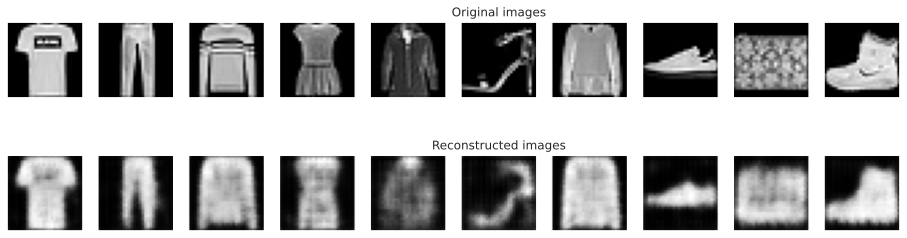

	 EPOCH 2/10 - train loss: 0.018885575234889984


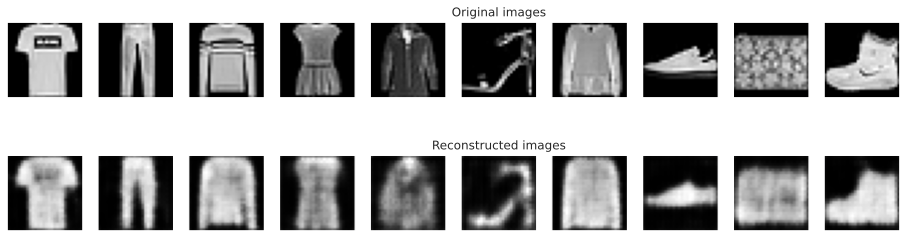

	 EPOCH 3/10 - train loss: 0.017141452059149742


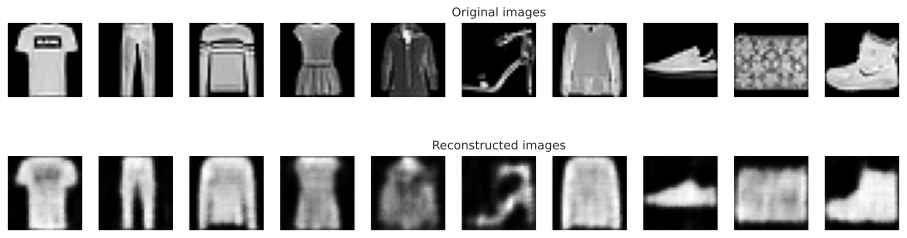

	 EPOCH 4/10 - train loss: 0.01653955690562725


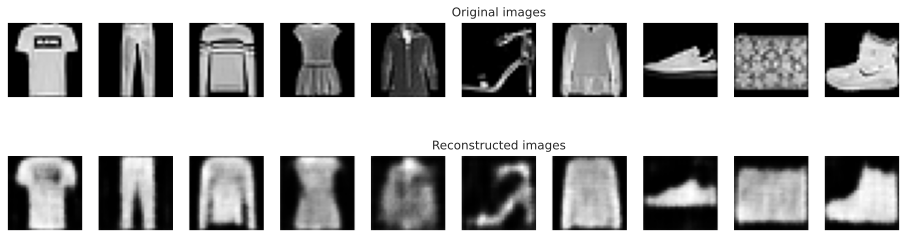

	 EPOCH 5/10 - train loss: 0.01634013094007969


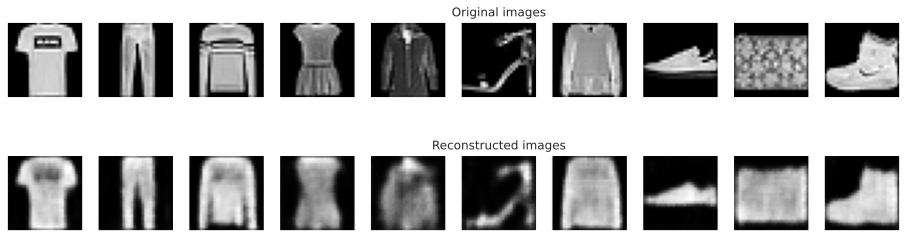

	 EPOCH 6/10 - train loss: 0.01549661997705698


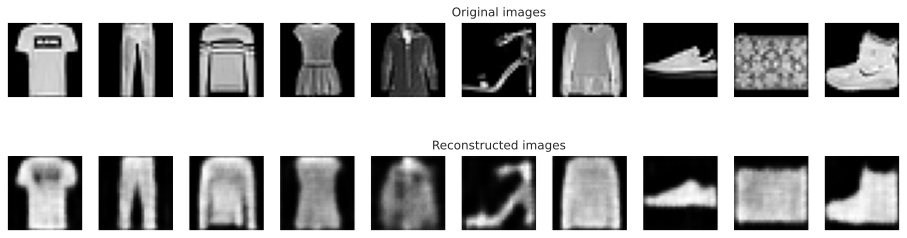

	 EPOCH 7/10 - train loss: 0.014633355662226677


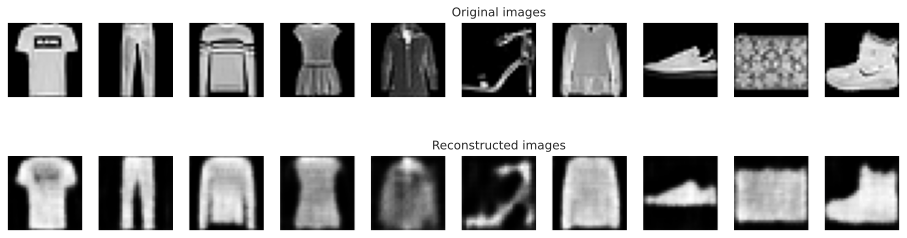

	 EPOCH 8/10 - train loss: 0.01484957616776228


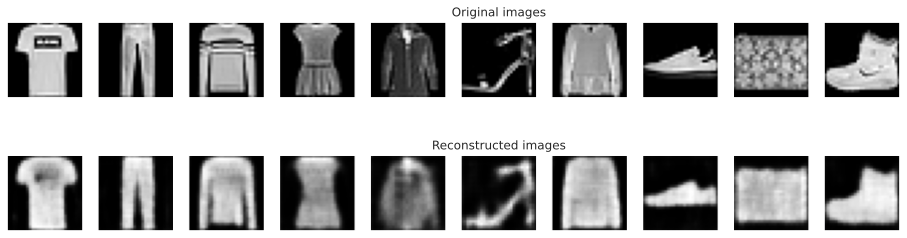

	 EPOCH 9/10 - train loss: 0.014932936057448387


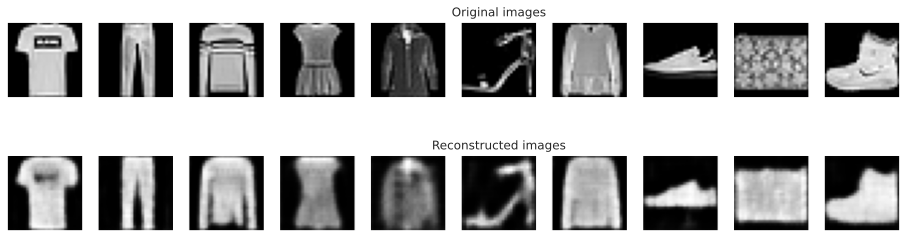

	 EPOCH 10/10 - train loss: 0.01344201248139143


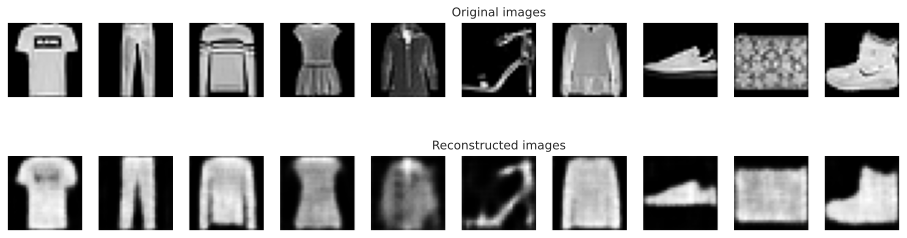

In [117]:
num_epochs = 10
for epoch in range(num_epochs):
    train_loss, _ = train(autoencoder, optimizer, train_epoch_autoencoder, test_epoch_autoencoder, train_dataset, loss_fn=nn.MSELoss(), num_epochs = 1, batch_size = 256, validation_data=None, threshold=0, verbose=False)
    print(f"\t EPOCH {epoch + 1}/{num_epochs} - train loss: {train_loss}")
    plot_ae_outputs(autoencoder, 10)

Test the autoencoder on the test set

Load the trained autoencoder

In [122]:
autoencoder.load_state_dict(torch.load('autoencoder.pth'))

In [121]:
_, _, test_loss = test_epoch_autoencoder(network = autoencoder, device=device, dataloader=test_dataloader, loss_fn=nn.MSELoss())
print("Test loss: %f" % test_loss)

Test loss: 0.013684


### Encoded representation of the test samples

In [61]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

  0%|          | 0/10000 [00:00<?, ?it/s]

In [62]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)

#### PCA embedding

In [63]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
encoded_samples_reduced_PCA = pca.fit_transform(encoded_samples)
encoded_samples_reduced_PCA

array([[ 4.59646691, -0.46051796],
       [-2.52371932,  0.81997498],
       [-3.53798876, -0.76001382],
       ...,
       [ 3.42228097,  0.36037711],
       [-3.50671667, -0.82947608],
       [ 0.57808264, -0.59632809]])

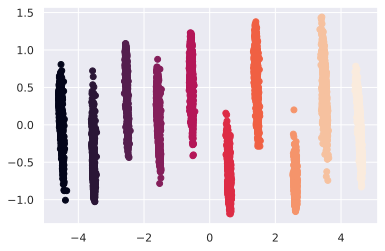

In [64]:
plt.scatter(encoded_samples_reduced_PCA[:,0], encoded_samples_reduced_PCA[:,1], c=encoded_samples.label.to_numpy())

#### t-SNE (t-distributed Stochastic Neighbor Embedding)

In [65]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples)

/home/federico/anaconda3/envs/torch/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/federico/anaconda3/envs/torch/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [66]:
# Prepare dataframe for plotting (no need to analyze this code)
df = pd.DataFrame(encoded_samples_reduced_TSNE)
df['label'] = encoded_samples.label.to_numpy()
df['label_name'] = df.label.apply(lambda l: id_to_label[l])
df

,0,1,label,label_name
0,-55.168488,15.364802,9,Ankle boot
1,-20.267258,20.564182,2,Pullover
2,26.102131,5.590930,1,Trouser
3,19.692123,-5.725999,1,Trouser
4,-7.660734,60.915760,6,Shirt
...,...,...,...,...
9995,-55.934250,28.194719,9,Ankle boot
9996,14.270823,-11.270336,1,Trouser
9997,-27.120378,-71.441216,8,Bag
9998,19.034706,-17.039204,1,Trouser


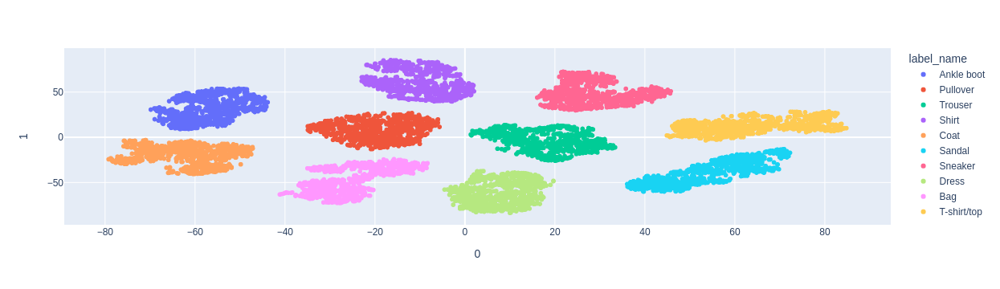

In [108]:
### Plot
px.scatter(df, x=0, y=1, color='label_name', hover_data=[df.index])

### Generate new samples from latent codes of training samples

Adding an offset of 0.2 to each unit of the latent representations of the training samples, we can observe that the output images do not represent anymore a valid class.

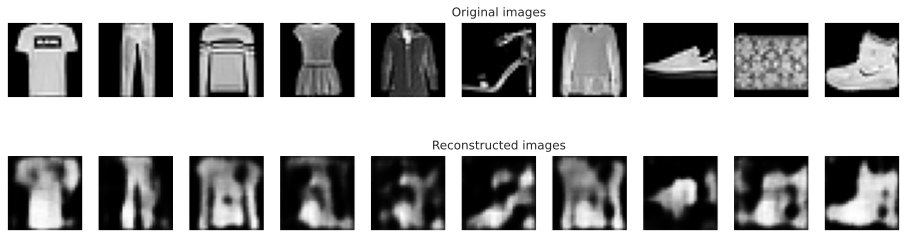

In [128]:
n = 10
plt.figure(figsize=(16,4.5))
targets = train_dataset.targets.numpy()
t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
for i in range(n):
    ax = plt.subplot(2,n,i+1)
    img = train_dataset[t_idx[i]][0].unsqueeze(0).to(device)
    img = img
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img)+0.2)
    plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)  
    if i == n//2:
        ax.set_title('Original images')
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)  
    if i == n//2:
        ax.set_title('Reconstructed images')
plt.show() 

### Explore the latente space

This behaviour can be better visualized generating images from random latent codes sampled from a normal distribution with mean 0 and variance 1.

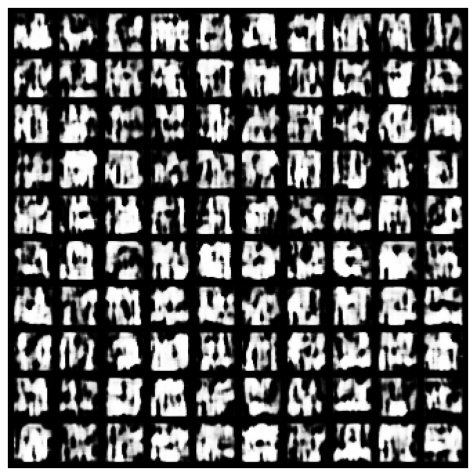

In [127]:
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

autoencoder.eval()

with torch.no_grad():

    # sample 100 latent vectors from a normal distribution with mean 0 and variance 1
    latent = torch.randn(100, 64, device=device)

    # reconstruct images from the latent vectors
    img_recon = autoencoder.decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(20, 8.5))
    show_image(torchvision.utils.make_grid(img_recon.data,10,5))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)  
    plt.show()

## Build a classifier by fine-tuning the encoder

As we have seen above, the latent representation of the test samples obtained from the encoder are well separable.
The idea is therefore to to fine-tune a network that is composed by the encoder plus one ore two fully connected layers on top.
This technique can be seen as a way to initiliaze the weights of the classifier, and it is especially useful when the training dataset is small.

In [72]:
### Training function
def train_epoch_classifier(network, device, dataloader, loss_fn, optimizer):
    # Set train mode
    network.train()
    for image_batch, label_batch in dataloader:
        # Move tensors to the selected device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Forward pass
        output = network(image_batch)
        # Evaluate loss
        loss = loss_fn(output, label_batch)
        # Backward pass and update
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

In [73]:
### Testing function
def test_epoch_classifier(network, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    network.eval()
    val_loss= []
    with torch.no_grad(): # Disable gradient tracking
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_target = []
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Forward pass
            output = network(image_batch)
            # Append the network output and the original image to the lists
            conc_out.append(output.cpu())
            conc_target.append(label_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_target = torch.cat(conc_target) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_target)
    return conc_out, conc_target, val_loss.data # We return all the outputs, all the labels and the global loss


### Stack one or two layers on top of the encoder

In [74]:
class define_classifier(nn.Module):

    def __init__(self, encoder, fc_hidden_units, out):   
        super().__init__()

        self.encoder = encoder

        ## Linear layers
        lin_layers = []
        in_features = encoder.dim_latent_space
        for i in range( len(fc_hidden_units) ):
            out_features = fc_hidden_units[i]
            lin_layers.append(nn.Linear(in_features = in_features, out_features = out_features))
            #lin_layers.append(nn.BatchNorm1d(out_features))
            lin_layers.append(nn.Dropout(0.2))
            lin_layers.append(nn.ReLU(True))
            in_features = out_features

        lin_layers.append(nn.Linear(in_features = out_features, out_features = out))

        self.fc_layers = nn.Sequential(*lin_layers)

        
    def forward(self, x):
        x = self.encoder(x)
        x = self.fc_layers(x)
        return x

### Exploit Optuna to find a good classifier

In [75]:
def objective2(trial):
    # Generate the model.
    K = trial.suggest_int("K", 1, 2)

    # defining the #hidden units for the fully connected layers
    fc_hidden_units = []
    fc_hidden_units.append(2**trial.suggest_int("fc_hidden_units_l0", 4, 9))
    for i in range(1,K):
        #fc_hidden_units.append(2**trial.suggest_int("fc_hidden_units_l{}".format(i), 5, math.floor(math.log2(fc_hidden_units[i-1]))))
        fc_hidden_units.append(2**trial.suggest_int("fc_hidden_units_l{}".format(i), 4, 9))

    # Define the loss function
    loss_fn = torch.nn.CrossEntropyLoss()

    # Generate the optimizer
    optimizer_name = trial.suggest_categorical("optimizer", ["RMSprop", "SGD", "Adam", "Adagrad"])
    lr = trial.suggest_float("lr", 1e-5, 1e-1, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-5, 1e-1, log=True)
    if (optimizer_name == "SGD"):
        momentum = trial.suggest_float("momentum", 0.0, 1.0)

    val_losses = []
    n_splits = 4 # => |training set| = 45000, |test set| = 15000
    kf = KFold(n_splits=n_splits,shuffle=True,random_state=0)
    
    for fold, (train_index,val_index) in enumerate(kf.split(np.arange(len(train_dataset)))):
        # restore the parameters of the autoencoder
        autoencoder.load_state_dict(torch.load('autoencoder.pth'))
        classifier = define_classifier(autoencoder.encoder, fc_hidden_units, out = 10).to(device)
        # Define the parameters to optimize
        params_to_optimize = [
            {'params': classifier.parameters() }
        ]
    
        if (optimizer_name == "SGD"):
            optimizer = getattr(optim, optimizer_name)(params_to_optimize, lr=lr, momentum = momentum, weight_decay = weight_decay)
        else:
            optimizer = getattr(optim, optimizer_name)(params_to_optimize, lr=lr, weight_decay = weight_decay)

        # datasets
        train_data = torch.utils.data.Subset(train_dataset, train_index)
        validation_data = torch.utils.data.Subset(train_dataset, val_index)

        train_loss, val_loss = train(classifier, optimizer, train_epoch_classifier, test_epoch_classifier, train_data, loss_fn, num_epochs = 5, batch_size = 256, validation_data=validation_data, threshold = 0.6, verbose=True)

        print("%d) TRAIN LOSS %f VAL LOSS = %f" % (fold, train_loss, val_loss), flush=True)
        val_loss = val_loss.detach().cpu().numpy()
        val_losses.append(val_loss)
        trial.report(val_loss, fold)
        # check if pruning
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

    return np.mean(val_losses)

Run Optuna for 1200 seconds

In [78]:
study = optuna.create_study(direction="minimize",pruner=optuna.pruners.ThresholdPruner(upper=0.3))
study.optimize(objective2, n_trials=100, timeout=1200)

pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Loss: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2022-01-26 10:54:14,552] A new study created in memory with name: no-name-436d0daa-3e8b-452f-b29e-a33b6ceb0af2


	 EPOCH 1/5 - train loss: 1.1310555934906006 - val loss: 1.139858365058899
0) TRAIN LOSS 1.131056 VAL LOSS = 1.139858


[I 2022-01-26 10:54:39,190] Trial 0 pruned. 


	 EPOCH 1/5 - train loss: 0.4236047863960266 - val loss: 0.4456796646118164
	 EPOCH 2/5 - train loss: 0.3155204653739929 - val loss: 0.34470459818840027
	 EPOCH 3/5 - train loss: 0.27017033100128174 - val loss: 0.3099723160266876
	 EPOCH 4/5 - train loss: 0.2415509819984436 - val loss: 0.29190391302108765
	 EPOCH 5/5 - train loss: 0.2190425843000412 - val loss: 0.27351024746894836
0) TRAIN LOSS 0.219043 VAL LOSS = 0.273510
	 EPOCH 1/5 - train loss: 0.3925815224647522 - val loss: 0.3923579752445221
	 EPOCH 2/5 - train loss: 0.30622348189353943 - val loss: 0.3195352852344513
	 EPOCH 3/5 - train loss: 0.26033881306648254 - val loss: 0.28484055399894714
	 EPOCH 4/5 - train loss: 0.24076594412326813 - val loss: 0.27697864174842834
	 EPOCH 5/5 - train loss: 0.22006776928901672 - val loss: 0.2657327651977539
1) TRAIN LOSS 0.220068 VAL LOSS = 0.265733
	 EPOCH 1/5 - train loss: 0.4203340709209442 - val loss: 0.4156268537044525
	 EPOCH 2/5 - train loss: 0.3270938992500305 - val loss: 0.333857208

[I 2022-01-26 11:03:03,690] Trial 1 finished with value: 0.2800394296646118 and parameters: {'K': 2, 'fc_hidden_units_l0': 5, 'fc_hidden_units_l1': 9, 'optimizer': 'Adam', 'lr': 0.00024490582406854757, 'weight_decay': 0.00026464213108239417}. Best is trial 1 with value: 0.2800394296646118.


	 EPOCH 1/5 - train loss: 1.0494803190231323 - val loss: 1.0584059953689575
0) TRAIN LOSS 1.049480 VAL LOSS = 1.058406


[I 2022-01-26 11:03:28,051] Trial 2 pruned. 


	 EPOCH 1/5 - train loss: 0.9854633808135986 - val loss: 0.9960061311721802
0) TRAIN LOSS 0.985463 VAL LOSS = 0.996006


[I 2022-01-26 11:03:52,777] Trial 3 pruned. 


	 EPOCH 1/5 - train loss: 2.276350259780884 - val loss: 2.2768008708953857
0) TRAIN LOSS 2.276350 VAL LOSS = 2.276801


[I 2022-01-26 11:04:17,182] Trial 4 pruned. 


	 EPOCH 1/5 - train loss: 0.8331415057182312 - val loss: 0.8556633591651917
0) TRAIN LOSS 0.833142 VAL LOSS = 0.855663


[I 2022-01-26 11:04:42,274] Trial 5 pruned. 


	 EPOCH 1/5 - train loss: 0.8790984153747559 - val loss: 0.8924089670181274
0) TRAIN LOSS 0.879098 VAL LOSS = 0.892409


[I 2022-01-26 11:05:07,280] Trial 6 pruned. 


	 EPOCH 1/5 - train loss: 1.329945683479309 - val loss: 1.3434728384017944
0) TRAIN LOSS 1.329946 VAL LOSS = 1.343473


[I 2022-01-26 11:05:31,642] Trial 7 pruned. 


	 EPOCH 1/5 - train loss: 2.2909624576568604 - val loss: 2.2906947135925293
0) TRAIN LOSS 2.290962 VAL LOSS = 2.290695


[I 2022-01-26 11:05:56,071] Trial 8 pruned. 


	 EPOCH 1/5 - train loss: 2.37721586227417 - val loss: 2.3665993213653564
0) TRAIN LOSS 2.377216 VAL LOSS = 2.366599


[I 2022-01-26 11:06:21,232] Trial 9 pruned. 


	 EPOCH 1/5 - train loss: 2.2933764457702637 - val loss: 2.292990207672119
0) TRAIN LOSS 2.293376 VAL LOSS = 2.292990


[I 2022-01-26 11:06:45,378] Trial 10 pruned. 


	 EPOCH 1/5 - train loss: 0.9022219777107239 - val loss: 0.9118673801422119
0) TRAIN LOSS 0.902222 VAL LOSS = 0.911867


[I 2022-01-26 11:07:10,284] Trial 11 pruned. 


	 EPOCH 1/5 - train loss: 0.43884360790252686 - val loss: 0.45583170652389526
	 EPOCH 2/5 - train loss: 0.35449209809303284 - val loss: 0.3799351453781128
	 EPOCH 3/5 - train loss: 0.3546449840068817 - val loss: 0.37555578351020813
	 EPOCH 4/5 - train loss: 0.34578219056129456 - val loss: 0.37441694736480713
	 EPOCH 5/5 - train loss: 0.32595452666282654 - val loss: 0.35193750262260437
0) TRAIN LOSS 0.325955 VAL LOSS = 0.351938


[I 2022-01-26 11:09:15,653] Trial 12 pruned. 


	 EPOCH 1/5 - train loss: 1.675177812576294 - val loss: 1.6814831495285034
0) TRAIN LOSS 1.675178 VAL LOSS = 1.681483


[I 2022-01-26 11:09:40,784] Trial 13 pruned. 


	 EPOCH 1/5 - train loss: 2.011091470718384 - val loss: 2.012056827545166
0) TRAIN LOSS 2.011091 VAL LOSS = 2.012057


[I 2022-01-26 11:10:05,219] Trial 14 pruned. 


	 EPOCH 1/5 - train loss: 0.32211706042289734 - val loss: 0.3458596467971802
	 EPOCH 2/5 - train loss: 0.26651865243911743 - val loss: 0.29992201924324036
	 EPOCH 3/5 - train loss: 0.24780091643333435 - val loss: 0.2893604040145874
	 EPOCH 4/5 - train loss: 0.20491516590118408 - val loss: 0.2567923665046692
	 EPOCH 5/5 - train loss: 0.21642090380191803 - val loss: 0.2801668345928192
0) TRAIN LOSS 0.216421 VAL LOSS = 0.280167
	 EPOCH 1/5 - train loss: 0.37662774324417114 - val loss: 0.3817439377307892
	 EPOCH 2/5 - train loss: 0.29068464040756226 - val loss: 0.30823755264282227
	 EPOCH 3/5 - train loss: 0.2939608693122864 - val loss: 0.32412105798721313
	 EPOCH 4/5 - train loss: 0.23549796640872955 - val loss: 0.2756563127040863
	 EPOCH 5/5 - train loss: 0.2138674259185791 - val loss: 0.2697327733039856
1) TRAIN LOSS 0.213867 VAL LOSS = 0.269733
	 EPOCH 1/5 - train loss: 0.3329452574253082 - val loss: 0.33486416935920715
	 EPOCH 2/5 - train loss: 0.30081188678741455 - val loss: 0.313268

[I 2022-01-26 11:18:27,048] Trial 15 finished with value: 0.2660936415195465 and parameters: {'K': 2, 'fc_hidden_units_l0': 6, 'fc_hidden_units_l1': 5, 'optimizer': 'Adam', 'lr': 0.0025971915400008604, 'weight_decay': 4.186869644620261e-05}. Best is trial 15 with value: 0.2660936415195465.


Study statistics: 
  Number of finished trials:  16
  Number of pruned trials:  14
  Number of complete trials:  2
Best trial:
  Loss:  0.2660936415195465
  Params: 
    K: 2
    fc_hidden_units_l0: 6
    fc_hidden_units_l1: 5
    optimizer: Adam
    lr: 0.0025971915400008604
    weight_decay: 4.186869644620261e-05


### Final model 4-fold cross validation

In [79]:
val_losses = []
n_splits = 4 # => |training set| = 45000, |test set| = 15000
kf = KFold(n_splits=n_splits,shuffle=True,random_state=0)

for fold, (train_index,val_index) in enumerate(kf.split(np.arange(len(train_dataset)))):
    # restore the parameters of the autoencoder
    autoencoder.load_state_dict(torch.load('autoencoder.pth'))
    fc_hidden_units = [64,32]
    classifier = define_classifier(autoencoder.encoder, fc_hidden_units, out = 10).to(device)
    optimizer = getattr(optim, "Adam")(classifier.parameters(), lr=0.0026, weight_decay = 4.2e-05)

    # datasets
    train_data = torch.utils.data.Subset(train_dataset, train_index)
    validation_data = torch.utils.data.Subset(train_dataset, val_index)

    train_loss, val_loss = train(classifier, optimizer, train_epoch_classifier, test_epoch_classifier, train_data, loss_fn = nn.CrossEntropyLoss(), num_epochs = 10, batch_size = 256, validation_data=validation_data, threshold = 0, verbose=True)

    print("%d) TRAIN LOSS %f VAL LOSS = %f" % (fold, train_loss, val_loss), flush=True)
    val_loss = val_loss.detach().cpu().numpy()
    val_losses.append(val_loss)

	 EPOCH 1/10 - train loss: 0.35530033707618713 - val loss: 0.3818047344684601
	 EPOCH 2/10 - train loss: 0.288389652967453 - val loss: 0.32696396112442017
	 EPOCH 3/10 - train loss: 0.24881787598133087 - val loss: 0.28514382243156433
	 EPOCH 4/10 - train loss: 0.22155572474002838 - val loss: 0.26959967613220215
	 EPOCH 5/10 - train loss: 0.21920935809612274 - val loss: 0.28812405467033386
	 EPOCH 6/10 - train loss: 0.19071975350379944 - val loss: 0.25739577412605286
	 EPOCH 7/10 - train loss: 0.19292472302913666 - val loss: 0.2734457552433014
	 EPOCH 8/10 - train loss: 0.16311250627040863 - val loss: 0.23952220380306244
	 EPOCH 9/10 - train loss: 0.18583133816719055 - val loss: 0.269601970911026
	 EPOCH 10/10 - train loss: 0.13758330047130585 - val loss: 0.24285098910331726
0) TRAIN LOSS 0.137583 VAL LOSS = 0.242851
	 EPOCH 1/10 - train loss: 0.33604955673217773 - val loss: 0.34738239645957947
	 EPOCH 2/10 - train loss: 0.29514309763908386 - val loss: 0.3113211393356323
	 EPOCH 3/10 - 

In [80]:
print("Cross-validation loss = %f" % np.mean(val_losses))

Cross-validation loss = 0.255184


### Train the model using the whole training set for 10 epochs

In [82]:
# restore the parameters of the autoencoder
autoencoder.load_state_dict(torch.load('autoencoder.pth'))
fc_hidden_units = [128]
classifier = define_classifier(autoencoder.encoder, fc_hidden_units, out = 10).to(device)
optimizer = getattr(optim, "Adam")(classifier.parameters(), lr=0.0026, weight_decay = 4.2e-05)

In [83]:
num_epochs = 10
train_losses = []
for epoch in range(num_epochs):
    ### Training (use the training function)
    train_epoch_classifier(
        network=classifier,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=nn.CrossEntropyLoss(), 
        optimizer=optimizer)

    ### Train loss (use the TESTING function! We want the train loss but using the network in eval mode)
    _, _, train_loss = test_epoch_classifier(
        network=classifier,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=nn.CrossEntropyLoss())

    train_losses.append(train_loss)

    # Print Train loss
    print(f"\t EPOCH {epoch + 1}/{num_epochs} - train loss: {train_loss}")

	 EPOCH 1/10 - train loss: 0.283887654542923
	 EPOCH 2/10 - train loss: 0.27114754915237427
	 EPOCH 3/10 - train loss: 0.21797819435596466
	 EPOCH 4/10 - train loss: 0.19299475848674774
	 EPOCH 5/10 - train loss: 0.19104404747486115
	 EPOCH 6/10 - train loss: 0.17072385549545288
	 EPOCH 7/10 - train loss: 0.17053094506263733
	 EPOCH 8/10 - train loss: 0.1450396031141281
	 EPOCH 9/10 - train loss: 0.13494278490543365
	 EPOCH 10/10 - train loss: 0.1081918329000473


Load the trained classifier

In [ ]:
#classifier.load_state_dict(torch.load('classifier.pth'))

In [84]:
### Test loss
test_outputs, test_labels, test_loss = test_epoch_classifier(
    network=classifier,
    device=device, 
    dataloader=test_dataloader, 
    loss_fn= nn.CrossEntropyLoss()
)
# Print Test loss
print(f"TEST LOSS : {test_loss}")

TEST LOSS : 0.253630131483078


### Accuracy and Confusion matrix

In [85]:
### Confusion matrix
# Predicted labels
y_true = test_labels.cpu().data.numpy()
y_pred = test_outputs.cpu().argmax(dim=1).numpy()
acc = metrics.accuracy_score(y_true, y_pred)
print("Accuracy = %f" % acc)
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

Accuracy = 0.914800


,0,1,2,3,4,5,6,7,8,9
0,867,1,14,19,1,1,89,1,7,0
1,0,982,3,9,2,0,3,0,1,0
2,15,1,880,6,39,0,59,0,0,0
3,14,2,7,914,25,0,38,0,0,0
4,1,0,73,20,835,0,71,0,0,0
5,0,0,0,0,0,973,0,19,0,8
6,82,1,53,26,50,0,782,1,5,0
7,0,0,0,0,0,9,0,968,1,22
8,6,1,1,2,1,2,4,3,979,1
9,1,0,0,0,0,4,0,27,0,968


If we compare these results with the ones obtained in hw1, we can observe that the test accuracy is slightly lower (91.4% vs 93.0%), however if we analyze the cross-validation reports we can appreciate a much faster converge in the case the autoencoder technique is used, and this is because the weights have been well initialized as we have seen using PCA and t-SNE on the encoded test samples.

## Variational AutoEncoder (VAE)

### Define the VAE

The variational autoencoder aims at building a regular latent space in order to generate valid data from latent vectors sampled from the latent space. <br>
To do this the encoder must be slightly modified, while the decoder is the same as before.

For the VAE, the encoder must return two values (that will represent the mean and the variance of the distribution associated to an encoded sample), therefore, at the end we will have two ouput layers instead of one.

In [97]:
class define_variational_encoder(nn.Module):

    def __init__(self, N, filter_sizes, fc_hidden_units, dim_latent_space):   
        super().__init__()
        # ENCODER = [[CONV -> RELU]*N -> POOL]*2 {7x7} -> [FC -> RELU]*K -> FC

        ## Convolutional layers
        conv_layers = []
        in_channels = 1
        for i in range(len(filter_sizes)):
            out_channels = filter_sizes[i]
            for j in range(N):
                conv_layers.append(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1))
                conv_layers.append(nn.BatchNorm2d(out_channels))
                conv_layers.append(nn.ReLU(True))
                in_channels = out_channels
            conv_layers.append(nn.MaxPool2d(kernel_size = 2, stride=2))
        # 7x7 feature maps 

        self.encoder_cnn = nn.Sequential(*conv_layers) 

        ## Flatten
        self.flatten = nn.Flatten(start_dim=1)

        ## Linear layers
        lin_layers = []
        in_features = out_channels*49
        for i in range( len(fc_hidden_units) ):
            out_features = fc_hidden_units[i]
            lin_layers.append(nn.Linear(in_features = in_features, out_features = out_features))
            lin_layers.append(nn.BatchNorm1d(out_features))
            lin_layers.append(nn.ReLU(True))
            in_features = out_features

        self.encoder_lin = nn.Sequential(*lin_layers) 
        
        self.mean = nn.Linear(in_features = in_features, out_features = dim_latent_space)
        self.var  = nn.Linear(in_features = in_features, out_features = dim_latent_space)

        self.dim_latent_space = dim_latent_space
        
    def forward(self, x):
        # Apply convolutions
        x = self.encoder_cnn(x)
        # Flatten
        x = self.flatten(x)
        # Apply linear layers
        x = self.encoder_lin(x)
        mean = self.mean(x)
        log_var = self.var(x) 
    
        return mean, log_var

The 'reparameterize' function returns a sample from a normal distribution with mean and standard deviation defined by the encoder. <br>
In this way, every time the same input image is passed to the encoder, the decoder receives in input different points close to each other, and therefore forcing the decoder to learn in a continous way. 

In practive log variance is used instead of variance to have positive and negative values (instead of only positive values) and also to have a more fine-grained scale.

In [98]:
class define_VAE(nn.Module):
    def __init__(self, encoder, decoder):  
        super().__init__() 
        self.encoder = encoder
        self.decoder = decoder

    def reparameterize(self, mean, log_var):
        if self.training:
            std = log_var.mul(0.5).exp_()               # log variance -> standard deviation
            eps = std.data.new(std.size()).normal_()    # generate samples from a normal distribution with mean=0 and std=1
            return eps.mul(std).add_(mean)              # eps*std + mean (sample from a normal distribution with mean=mean and std=std)
        else:
            return mean

    def forward(self, x):
        # Apply the encoder
        mean, log_var = self.encoder(x)
        z = self.reparameterize(mean,log_var)
        # Apply the decoder
        y = self.decoder(z)
        return y, mean, log_var

A regularization term is then added to the reconstruction loss in order to force the network to produce a latent distribution as close as possible to the standard normal distribution (mean=0, variance=1). <br>
This regularization term is represented as the Kulback-Leibler divergence between the returned distribution and the standard normal distribution.

In [99]:
def loss_fn_KLD(mean, log_var):
    KLD = - 0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())
    return KLD

Define a training epoch

In [100]:
### Training function
def train_epoch_VAE(network, device, dataloader, loss_fn, optimizer):
    # Set train mode
    network.train()
    for image_batch, _ in dataloader:
        # Move tensors to the selected device
        image_batch = image_batch.to(device)
        # Forward pass
        output, mean, log_var = network(image_batch)
        # Evaluate loss
        loss = loss_fn(output, image_batch) + loss_fn_KLD(mean, log_var)
        # Backward pass and update
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

Define a test epoch

In [101]:
### Testing function
## loss_fn : reconstruction loss
def test_epoch_VAE(network, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    network.eval()
    val_loss= []
    with torch.no_grad(): # Disable gradient tracking
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_target = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Forward pass
            output, mean, log_var = network(image_batch)
            # Append the network output and the original image to the lists
            conc_out.append(output.cpu())
            conc_target.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_target = torch.cat(conc_target) 
        # Evaluate global loss
        rec_loss = loss_fn(conc_out, conc_target)
        KLD_loss = loss_fn_KLD(mean, log_var)
        val_loss = rec_loss + KLD_loss

    return conc_out, conc_target, val_loss.data # We return all the outputs, all the labels and the global loss


In [102]:
VAE_encoder = define_variational_encoder(1, [8,8], [128], 32)
VAE_decoder = define_decoder(32, [128], [8,8], 1)
VAE = define_VAE(VAE_encoder,VAE_decoder).to(device)
optimizer = getattr(optim, "Adam")(VAE.parameters(), lr=1e-3, weight_decay = 1e-03)

### Train the VAE

In [157]:
#VAE.load_state_dict(torch.load('VAE.pth'))

	 EPOCH 1/10 - train loss: 22.82163429260254


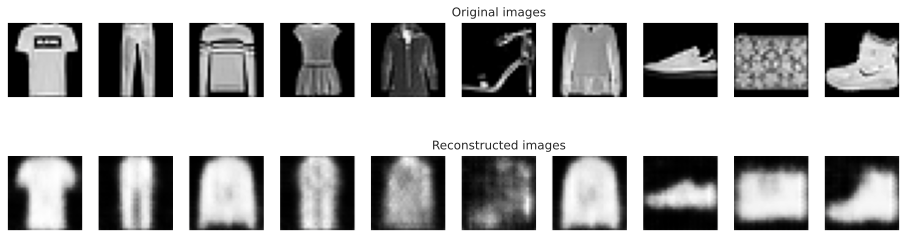

	 EPOCH 2/10 - train loss: 19.09886360168457


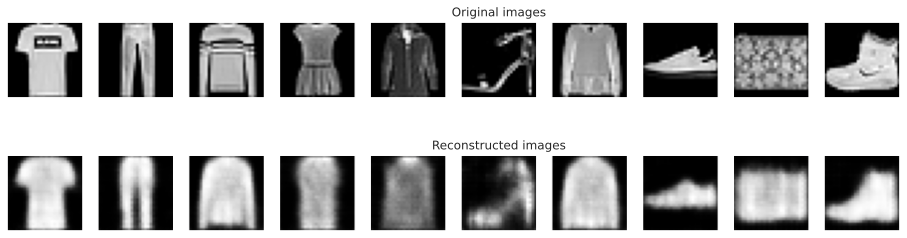

	 EPOCH 3/10 - train loss: 17.613502502441406


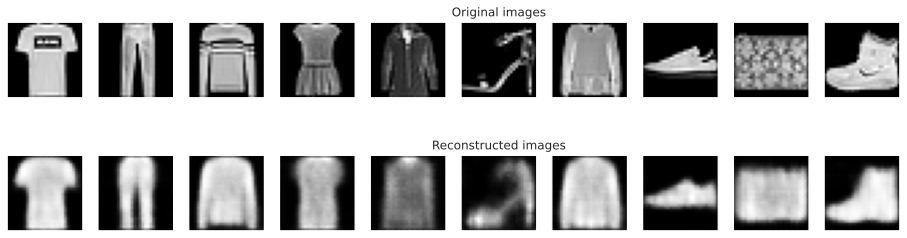

	 EPOCH 4/10 - train loss: 16.765710830688477


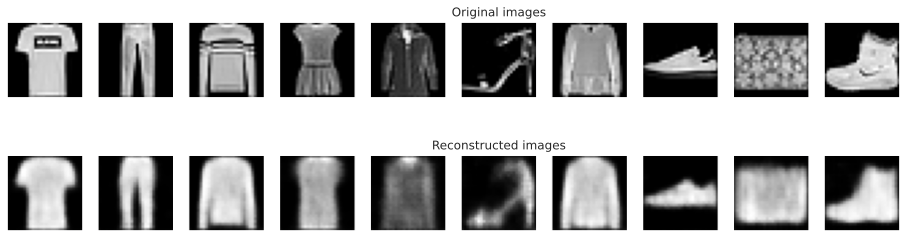

	 EPOCH 5/10 - train loss: 16.461090087890625


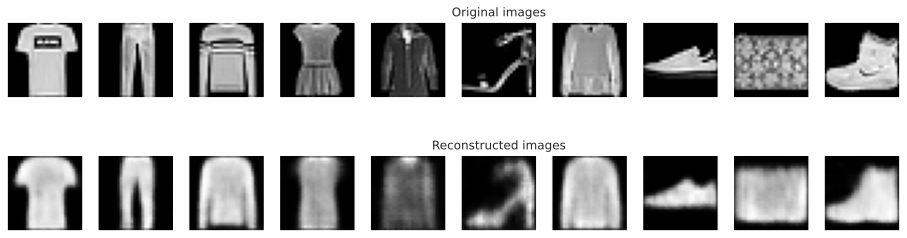

	 EPOCH 6/10 - train loss: 16.50078010559082


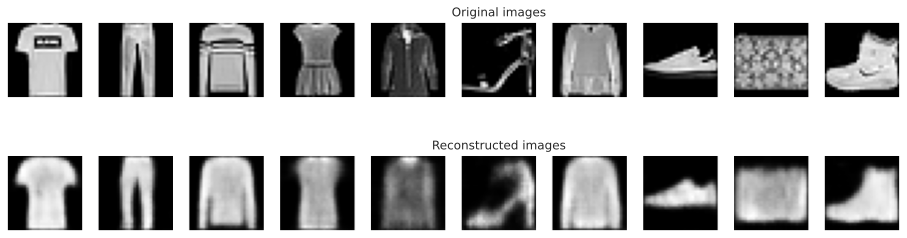

	 EPOCH 7/10 - train loss: 15.84885025024414


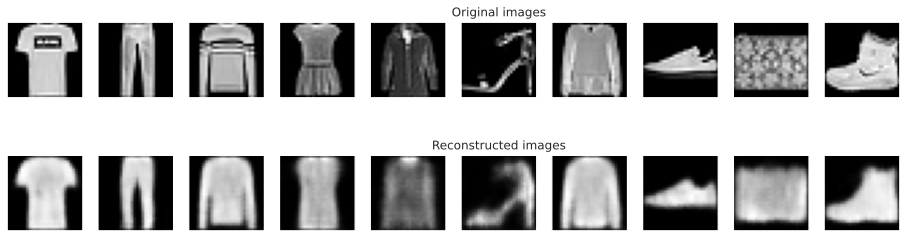

	 EPOCH 8/10 - train loss: 15.268808364868164


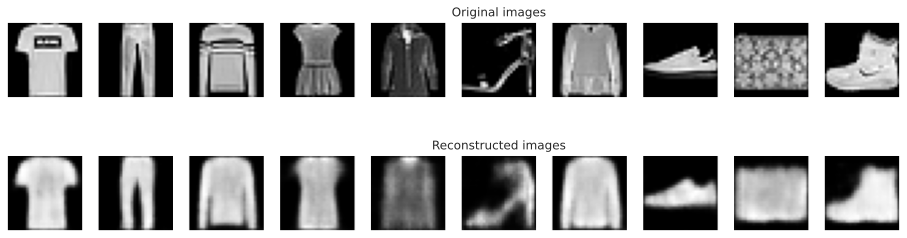

	 EPOCH 9/10 - train loss: 15.06236743927002


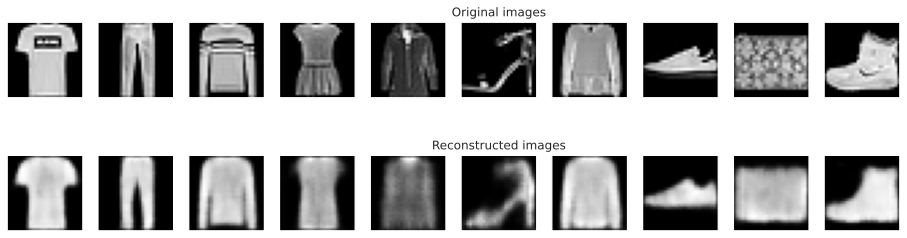

	 EPOCH 10/10 - train loss: 14.862025260925293


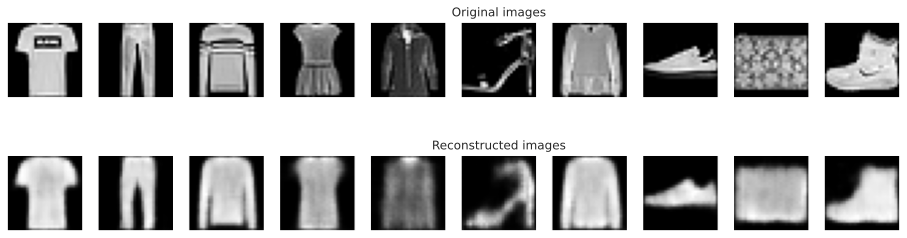

In [103]:
num_epochs = 10
for epoch in range(num_epochs):
    train_loss, _ = train(VAE, optimizer, train_epoch_VAE, test_epoch_VAE, train_dataset, loss_fn=nn.MSELoss(reduction='sum'), num_epochs = 1, batch_size = 256, validation_data=None, threshold=0, verbose=False)
    print(f"\t EPOCH {epoch + 1}/{num_epochs} - train loss: {train_loss/len(train_dataset)}")
    plot_ae_outputs(VAE, 10)

### Generate random samples from the latent space

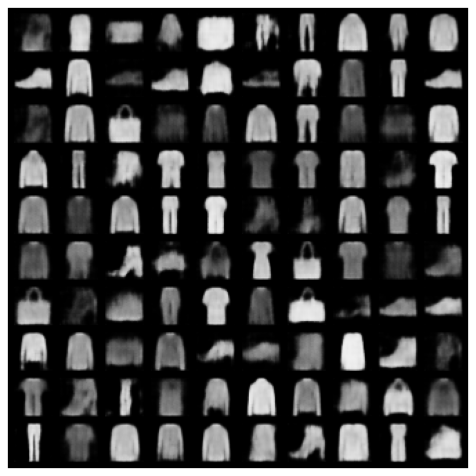

In [105]:
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

VAE.eval()
with torch.no_grad():

    # sample 100 latent vectors from the normal distribution
    latent = torch.randn(100, 32, device=device)

    # reconstruct images from the latent vectors
    img_recon = VAE.decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(20, 8.5))
    show_image(torchvision.utils.make_grid(img_recon.data,10,5))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.show()

As can we see, now random samples from the latent space are decoded in valid images.

### Linear interpolation of two latent codes

Another thing that we can try to explore the latent space is to reconstruct the latent codes obtained by applying a linear interpolation between two latent codes (e.g. of two training samples).

In [357]:
# generate n interpolated latent codes between the latent codes of img1 and img2, and plot the reconstructed images
def interpolate(img1, img2, n=1):
    img1 = img1.unsqueeze(0).to(device)
    img2 = img2.unsqueeze(0).to(device)
    N = 2+n # total images in the plot
    
    autoencoder.eval()
    with torch.no_grad():
        h_img1 = VAE.encoder(img1)[0]
        h_img2 = VAE.encoder(img2)[0]
        rec_img1 = VAE.decoder(h_img1)
        rec_img2 = VAE.decoder(h_img2)
            
    plt.figure(figsize=(16,4.5))
    ax = plt.subplot(1,N,1)
    ax.set_title('img1')
    plt.imshow(rec_img1.cpu().squeeze().numpy(), cmap='gist_gray')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False) 
    
    for i in range(n):
        autoencoder.eval()
        with torch.no_grad():
            interp_code = (1 - (i+1) / (n+1) ) * h_img1 + ( (i+1) / (n+1) ) * h_img2
            rec_img = VAE.decoder(interp_code)
            
        ax = plt.subplot(1,N,i+2)
        ax.set_title("n=%d" % (i+1))
        plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  

        
    ax = plt.subplot(1,N,N)
    ax.set_title('img2')
    plt.imshow(rec_img2.cpu().squeeze().numpy(), cmap='gist_gray')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False) 
    plt.show() 
    

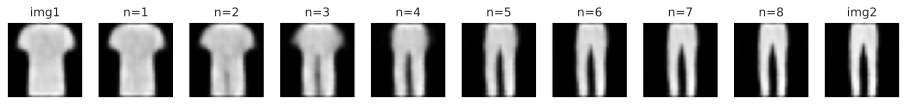

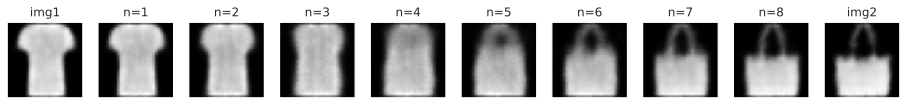

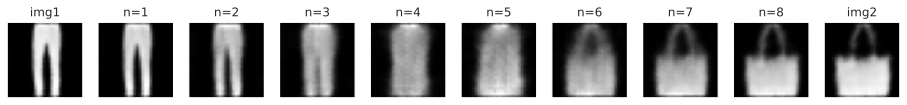

In [355]:
img1 = train_dataset[10][0]
img2 = train_dataset[170][0]
img3 = train_dataset[2502][0]

interpolate(img1, img2, n=8)
interpolate(img1, img3, n=8)
interpolate(img2, img3, n=8)

As we can observe, the interpolated latent codes, once reconstructed, still represent valid information. 
Moreover, the reconstructed images assume characteristics that are inbetween of the two original images, depending on how much the latent code is close to one sample instead of the other.